# Introduction`

## Import libraries

In [5]:
%matplotlib inline

import pandas as pd
import datetime 
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
import glob
import os
import getpass
import sqlalchemy
#import geoalchemy2
import sys
import itertools

import peakutils

import statsmodels.api as sm
from scipy.fftpack import fft

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.stats.stattools import durbin_watson
#from sklearn.linear_model import LinearRegression, LassoLars, lars_path, lasso_path
#from sklearn.preprocessing import normalize
from statsmodels.tsa.arima_model import ARIMA

from scipy.stats import linregress
import matplotlib as mpl
import matplotlib.cm as cm


from stldecompose import decompose, forecast
from stldecompose.forecast_funcs import (naive,
                                         drift, 
                                         mean, 
                                         seasonal_naive)

#from shutil import copyfile
import pastas as ps

import io
import requests

import platform
from matplotlib import rcParams

import folium

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot,iplot_mpl,plot_mpl
import plotly.graph_objs as go

init_notebook_mode(connected=True)

from geoalchemy2 import Geometry, WKTElement
from sqlalchemy import *
import geopandas as gpd

import wellapplication as wa

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.stats.stattools import durbin_watson
from sklearn.linear_model import LinearRegression, LassoLars, lars_path, lasso_path
from sklearn.preprocessing import normalize
from statsmodels.tsa.arima_model import ARIMA


rcParams['figure.figsize'] = 15, 10
rcParams['pdf.fonttype'] = 42
inline_rc = dict(plt.rcParams)

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:69: MatplotlibDeprecationWarning:


The examples.directory rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2. In the future, examples will be found relative to the 'datapath' directory.



In [6]:
llpath = "G:/My Drive/Python/Pycharm/loggerloader/"
sys.path.append(llpath)
import loggerloader as ll

In [11]:
figloc = 'G:/My Drive/WORK/Leland_Harris/figures/'
file_place = 'G:/My Drive/WORK/Leland_Harris/intermediate_data/'

## Database Connections

In [8]:
import importlib.util
spec = importlib.util.spec_from_file_location("dbconnect", "G:/My Drive/Python/dbconnect.py")
dbconnect = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dbconnect)
engine = dbconnect.postconn_leland(port=5433)

engine2 = dbconnect.postconn(port=5433)

## Import Custom Functions

In [9]:
def crosscorr(datax, datay, lag=0):
    ''' 
    http://stackoverflow.com/questions/33171413/cross-correlation-time-lag-correlation-with-pandas
    Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    '''
    return datax.corr(datay.shift(lag))

def scatterColor(x0,y,w):
    """Creates scatter plot with points colored by variable.
    All input arrays must have matching lengths

    Arg:
        x0 (array): 
            array of x values
        y (array): 
            array of y values
        w (array): 
            array of scalar values

    Returns:
        slope and intercept of best fit line
    
    """
    import matplotlib as mpl
    import matplotlib.cm as cm
    cmap = plt.cm.get_cmap('RdYlBu')
    norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    m.set_array(w)
    sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

    xa = sm.add_constant(x0)

    est = sm.RLM(y, xa).fit()
    r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
    slope = est.params[1]

    x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
    x_prime = sm.add_constant(x_prime)
    y_hat = est.predict(x_prime)

    const = est.params[0]
    y2 = [i*slope + const for i in x0]

    plt.xlabel('Barometric Pressure (ft water)')
    plt.ylabel('Transducer Pressure (ft water)')
    lin = linregress(x0,y)
    x1 = np.arange(np.min(x0), np.max(x0),0.1)
    y1 = [i*lin[0]+lin[1] for i in x1]
    y2 = [i*slope+const for i in x1]
    plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} b = {:.0f}, r^2 = {:.2f}'.format(lin[0],lin[1],lin[2]**2))
    plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} b = {:.0f}, r2 = {:.2f}'.format(slope,const,r2))
    plt.legend()
    cbar = plt.colorbar(m)

    cbar.set_label('Julian Date')

    return slope,const

def plotlystuff(datasets, colnames, chrttypes=None, datatitles=None, chrttitle = 'well', colors=None,
                two_yaxes = False, axisdesig= None, axislabels=['Levels','Barometric Pressure']):
    """
    datasets = list of dataframes to plot
    colnames = list of column names for each df in datasets
    chrttypes = list of types of chart to plot for each dataset; options are markers, lines+markers, lines
    datatitles = labels to use for legend
    chrttitle = title for chart; default is well
    colors = list of colors to use for each dataset
    two_yaxes = turn on second y axis to show datasets at different scale (bool); defaults to False
    axisdesig = list of designations for each axis; y1 is left axist and y2 is right axis
    axislabels = labels to use for each y axis
    """
    if chrttypes is None:
        chrttypes = ['lines']*len(datasets)
    
    if datatitles is None:
        datatitles = colnames
    
    if axisdesig is None:
        axisdesig = ['y1']*len(datasets)
        
    if colors is None:
        if len(datasets) <= 5: 
            colors = ['#228B22','#F7DC6F','#FF1493','#663399','#FF0000']
        else:
            colors = []
            for i in range(len(datasets)):
                colors[i] = '#{:02x}{:02x}{:02x}'.format(r(), r(), r())
        
    r = lambda: random.randint(0,255)
    
    modetypes = ['markers','lines+markers','lines']
    datum = {}
    
    for i in range(len(datasets)):
        datum['d' + str(i)] = go.Scatter(
            x=datasets[i].index,
            y=datasets[i][colnames[i]],
            name = datatitles[i],
            line = dict(color = colors[i]),
            mode = chrttypes[i],
            opacity = 0.8,
            yaxis = axisdesig[i])
        
    data = list(datum.values())

    layout = dict(
        title=chrttitle,
        xaxis=dict(
            rangeslider=dict(
                visible = True
            ),
            type='date',
            tickformat='%Y-%m-%d %H:%M'
        ),
        yaxis=dict(title=axislabels[0],
                   titlefont=dict(color='#1f77b4'),
                   tickfont=dict(color='#1f77b4')),
    )
    
    
    if two_yaxes:
        layout['yaxis2'] = dict(title=axislabels[1], titlefont=dict(color='#ff7f0e'),
                    tickfont=dict(color='#ff7f0e'),
                    anchor='x',
                    overlaying='y',
                    side='right',
                    position=0.15)

    fig = dict(data=data, layout=layout)
    iplot(fig, filename = 'well')
    return 

## Import Data

In [12]:
ugs_clim_raw_dly = pd.read_pickle(file_place + "ugs_clim_dly.pickle")
climate_data = pd.read_pickle(file_place+'climate_data.pickle')
wls = pd.read_pickle(file_place+"raw_hydrograph_data.pickle")
st_mt_df = pd.read_pickle(file_place+'climate_station_metadata1.pickle')
wls_piv = pd.read_pickle(file_place+"pivotedwells.pickle")
prismloc = pd.read_pickle(file_place+'prism_local_SG25.pickle')

ugs_clim_raw = pd.read_pickle(file_place + "ugs_clim.pickle")

# ET Estimates

Methods derived from Fahle and Dietrich (2013)<br> http://agupubs.onlinelibrary.wiley.com/doi/abs/10.1002/2013WR014472

In [15]:
pzdf = wls_piv[wls_piv.index.month.isin(range(4,11))]

In [21]:
pzdf

,SG25A_wle,SG25A_t,SG25B_wle,SG25B_t,SG25C_wle,SG25C_t,SG25D_wle,SG25D_t,1011_t,1011_wle,...,1014_t,1014_wle,1016_t,1016_wle,1017_t,1017_wle,1019_t,1019_wle,1020_t,1020_wle
readingdate,,,,,,,,,,,,,,,,,,,,,
2010-04-01 00:00:00,4786.469,8.223,4786.806,7.800,4789.320,7.500,4788.768,11.315,5.6,4782.390,...,NaN,NaN,7.100,4779.319,7.20,4778.885,4.6,4779.786,7.4,4780.682
2010-04-01 01:00:00,4786.468,8.277,4786.803,7.800,4789.314,7.528,4788.765,11.585,5.6,4782.393,...,NaN,NaN,7.100,4779.318,7.20,4778.890,4.6,4779.792,7.4,4780.687
2010-04-01 02:00:00,4786.484,8.200,4786.818,7.833,4789.323,7.543,4788.779,11.315,5.6,4782.388,...,NaN,NaN,7.027,4779.319,7.20,4778.889,4.6,4779.781,7.4,4780.683
2010-04-01 03:00:00,4786.476,8.200,4786.809,7.900,4789.313,7.428,4788.772,11.595,5.6,4782.390,...,NaN,NaN,7.000,4779.321,7.20,4778.889,4.6,4779.786,7.4,4780.684
2010-04-01 04:00:00,4786.472,8.177,4786.800,7.900,4789.304,7.500,4788.766,11.505,5.6,4782.388,...,NaN,NaN,7.000,4779.322,7.15,4778.890,4.6,4779.786,7.4,4780.682
2010-04-01 05:00:00,4786.470,8.100,4786.800,7.933,4789.304,7.500,4788.765,11.600,5.6,4782.386,...,NaN,NaN,6.927,4779.318,7.15,4778.891,4.6,4779.787,7.4,4780.683
2010-04-01 06:00:00,4786.475,8.100,4786.803,7.967,4789.305,7.472,4788.769,11.600,5.6,4782.387,...,NaN,NaN,6.973,4779.319,7.20,4778.891,4.6,4779.784,7.4,4780.687
2010-04-01 07:00:00,4786.485,8.123,4786.811,7.933,4789.310,7.372,4788.779,11.600,5.6,4782.388,...,NaN,NaN,6.927,4779.320,7.20,4778.888,4.6,4779.786,7.4,4780.684
2010-04-01 08:00:00,4786.475,8.200,4786.796,7.967,4789.297,7.328,4788.762,11.600,5.6,4782.390,...,NaN,NaN,6.900,4779.319,7.20,4778.891,4.6,4779.787,7.4,4780.690


In [19]:
plotlystuff([pzdf]*3,['1011_wle','1012_wle','1013_wle'])

## Gribovszki

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\peakutils\peak.py:84: RuntimeWarning:

invalid value encountered in less

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\peakutils\peak.py:84: RuntimeWarning:

invalid value encountered in greater



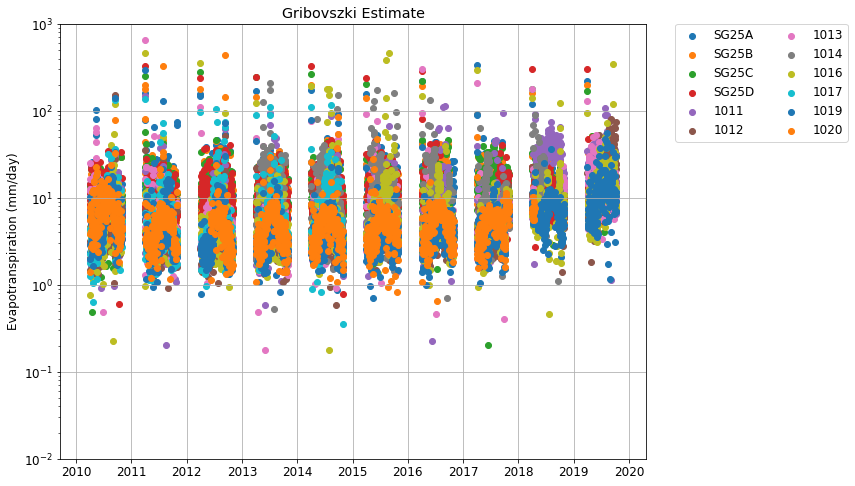

In [28]:
rcParams['figure.figsize'] = 10.5, 8
rcParams['font.size'] = 12
plt.figure()

dailyet_grib = {} 

for ind in pzdf.columns:
    if '_wle' in ind:
        df = pzdf.loc[:,ind].to_frame()
        df['del_waterelevation'] = df.diff()
        indexes = peakutils.indexes(df['del_waterelevation'], thres=0.002, min_dist=15)
        x1 = df.index[indexes]
        y2 = df.loc[x1,'del_waterelevation']

        peaks_df = pd.DataFrame([x1,y2]).T
        peaks_df.columns = ['readingdate','peaks_waterelevation']
        peaks_df = peaks_df.set_index(pd.to_datetime(peaks_df['readingdate']))
        peaks_df = peaks_df.resample('1H').fillna('pad')#.interpolate(method='time')

        x3 = peaks_df.index
        y3 = peaks_df['peaks_waterelevation'].interpolate(method='time')

        volcalc = pd.concat([df,peaks_df],axis=1)

        volcalc['et'] = volcalc['peaks_waterelevation'] - volcalc[ind].diff()

        volcalc['et_mm'] = volcalc['et']*25.4
        dlyet = volcalc['et_mm'].groupby(pd.Grouper(freq='1D')).sum()
        dailyet_grib[ind] = dlyet.to_frame()
        x = dailyet_grib[ind].index
        y = dailyet_grib[ind].et_mm

        plt.scatter(x,y,label=ind[:-4])
dfgrib = pd.concat(dailyet_grib)
plt.grid()
plt.legend(ncol=2, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title("Gribovszki Estimate")
plt.yscale('log')
plt.ylim(0.01,1000)
plt.ylabel('Evapotranspiration (mm/day)')
#peaks_x = peakutils.interpolate(piez[1011].index, piez[1011]['waterelevation'], ind=indexes)
#print(peaks_x)
plt.savefig(figloc+"ET_Est_Grib.png")
plt.savefig(figloc+"ET_Est_Grib.pdf")
plt.savefig(figloc+"ET_Est_Grib.svg")

## Hays

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\peakutils\peak.py:84: RuntimeWarning:

invalid value encountered in less

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\peakutils\peak.py:84: RuntimeWarning:

invalid value encountered in greater



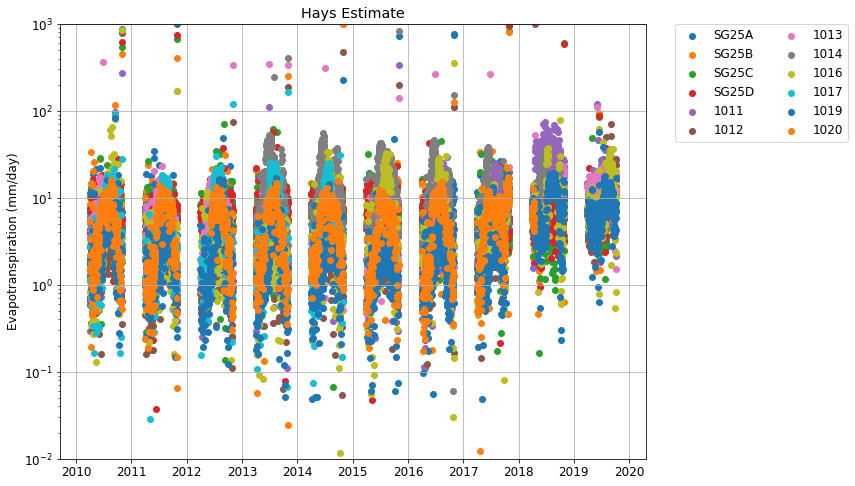

In [32]:
rcParams['figure.figsize'] = 10.5, 8
rcParams['font.size'] = 12
plt.figure()

dlyet = {}

for ind in pzdf.columns:
    if '_wle' in ind:
        df = pzdf.loc[:,ind].to_frame()
        df['datetime'] = df.index
        indexes = peakutils.indexes(df[ind], thres=0.002, min_dist=15)
        indexes2 = peakutils.indexes(df[ind]*-1, thres=0.002, min_dist=15)

        dfhigh = df.iloc[indexes]
        dfhigh['opt'] = 'high'
        dflow = df.iloc[indexes2]
        dflow['opt'] = 'low'

        dfhighlow = pd.concat([dfhigh, dflow]).sort_index()

        Sy = 0.15
        dfhighlow['H1-L1'] = dfhighlow[ind].diff(-1)
        dfhighlow['L2-H1'] = dfhighlow[ind].diff(1).shift(-2)
        dfhighlow['T1'] = dfhighlow['datetime'].diff(1).shift(-1)/pd.Timedelta('1D')
        dfhighlow['T2'] = dfhighlow['datetime'].diff(1).shift(-2)/pd.Timedelta('1D')
        dfhighlow = dfhighlow[dfhighlow['opt']=='high'].dropna(subset=['L2-H1'])

        dfhighlow['rech_rate'] = dfhighlow['H1-L1']/dfhighlow['T1']*304.8
        dfhighlow['et_mm'] = (dfhighlow['H1-L1'] + dfhighlow['T2']*dfhighlow['H1-L1']/dfhighlow['T1'])*Sy*304.8

        dlyet[ind] = dfhighlow[['et_mm','rech_rate']].groupby(pd.Grouper(freq='1D')).sum()
        x = dlyet[ind].index
        y = dlyet[ind].et_mm

        plt.scatter(x,y,label=ind[:-4])
    dfhays = pd.concat(dlyet)
plt.grid()
plt.yscale('log')
plt.ylim(0.01,1000)
plt.legend(ncol=2, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title("Hays Estimate")
plt.ylabel('Evapotranspiration (mm/day)')

plt.savefig(figloc+"ET_Est_Hays.png")
plt.savefig(figloc+"ET_Est_Hays.pdf")
plt.savefig(figloc+"ET_Est_Hays.svg")

## Modified White

SG25A_wle


C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\peakutils\peak.py:84: RuntimeWarning:

invalid value encountered in less

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\peakutils\peak.py:84: RuntimeWarning:

invalid value encountered in greater



SG25B_wle
SG25C_wle
SG25D_wle
1011_wle
1012_wle
1013_wle
1014_wle
1016_wle
1017_wle
1019_wle
1020_wle


C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:66: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




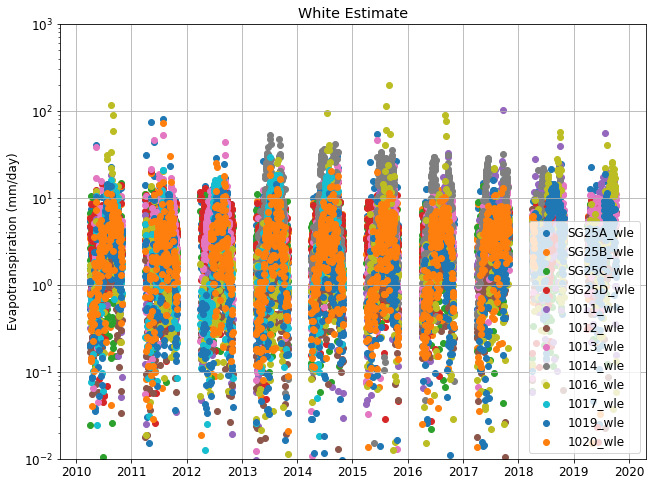

In [33]:
import scipy.stats as sp
import statsmodels.api as sm

dfdly = {}

rcParams['figure.figsize'] = 10.5, 8
rcParams['font.size'] = 12
plt.figure()

for ind in pzdf.columns:
    if '_wle' in ind:
    #plt.figure()
        df = pzdf.loc[:,ind].to_frame()
        df['datetime'] = df.index
        indexes = peakutils.indexes(df[ind], thres=0.002, min_dist=15)
        indexes2 = peakutils.indexes(df[ind]*-1, thres=0.002, min_dist=15)

        dfhigh = df.iloc[indexes]
        dfhigh['opt'] = 'high'
        dflow = df.iloc[indexes2]
        dflow['opt'] = 'low'

        dfmid = df[ind].resample('1H').mean().interpolate(method='time').resample('1D').first().diff()*304.8
        dfmid.name = 'net_change'

        dfsix = df.between_time('18:00','6:00')
        dfsix['doy'] = dfsix.index.dayofyear # designate day of year
        dfsix['year'] = dfsix.index.year
        dfsix['noy'] = dfsix['doy'].shift(-6) # designate night of year

        recharge = {}
        print(ind)
        for yr in range(df.first_valid_index().year, df.last_valid_index().year+1):
                dfy = dfsix[dfsix['year']==yr]
                dfy = dfy.dropna(subset=['noy'])
                for night in dfy['noy'].unique():
                    dfn = dfy[dfy['noy']==night]
                    x= dfn.index
                    xj = dfn.index.to_julian_date()
                    y = dfn[ind]
                    #plt.scatter(xj,y)
                    xa = sm.add_constant(xj)
                    est = sm.OLS(y.astype(float), xa.astype(float)).fit()
                    slope = est.params[1]
                    const = est.params[0]
                    r2 = est.rsquared
                    #plt.plot(xj,est.predict())
                    #plt.show()
                    #print('y = {:.4f}x + {:.2f}  R2: {:.2f}'.format(est.params[1],est.params[0],est.rsquared))
                    if est.params[1] is None:
                        pass
                    else:
                        recharge["{}-{}-{}".format(yr,int(night),ind)] = est.params[1]#[est.params[1],est.params[0],est.rsquared]
                #except:
                    #    pass

        dfsix['rech_rate_ft'] = dfsix[['year','doy']].apply(lambda x: recharge.get("{}-{}-{}".format(x[0],int(x[1]),ind)),1)
        dfet = dfsix.dropna(subset=['rech_rate_ft'])
        dfet['rech_rate_mm'] = dfet['rech_rate_ft']*304.8
        dfet['avg_et'] = np.mean([dfet['rech_rate_mm'],dfet['rech_rate_mm'].shift(1)],axis=0)
        dfdaily = dfet.groupby(pd.Grouper(freq='1D')).mean()
        dfdly[ind] = pd.concat([dfdaily,dfmid],axis=1)
        dfdly[ind]['et'] = (dfdly[ind]['avg_et'] + dfdly[ind]['net_change'])*0.15

        plt.scatter(dfdly[ind].index,dfdly[ind]['et'],label=ind)
dfwhite = pd.concat(dfdly)
plt.grid()
plt.title('White Estimate')
plt.yscale('log')
plt.ylim(0.01,1000)
plt.legend()
plt.ylabel('Evapotranspiration (mm/day)')

plt.savefig(figloc+"ET_Est_White.png")
plt.savefig(figloc+"ET_Est_White.pdf")
plt.savefig(figloc+"ET_Est_White.svg")

## ET Estimates Summary

In [34]:
dfhays.columns = ['hays_et','hays_rech']
dfgrib.columns = ['grib_et']

dfwhiteabb = dfwhite[['rech_rate_mm','et']]
dfwhiteabb.columns = ['white_rech','white_et']


In [35]:
dfg = dfgrib.reset_index().set_index('readingdate').drop('level_0',axis=1).resample('1D').median()
dfgribmean = dfg.groupby(pd.Grouper(freq = '1D')).median()

dfh = dfhays.reset_index().set_index('readingdate').drop('level_0',axis=1).resample('1D').median()
dfhaysmean = dfh.groupby(pd.Grouper(freq = '1D')).median()

dfw = dfwhiteabb.reset_index().set_index('readingdate').drop('level_0',axis=1).resample('1D').median()
dfwhitemean = dfw.groupby(pd.Grouper(freq = '1D')).median()

etdata = pd.concat([dfgribmean,dfhaysmean,dfwhitemean],axis=1)

(0.0, 40)

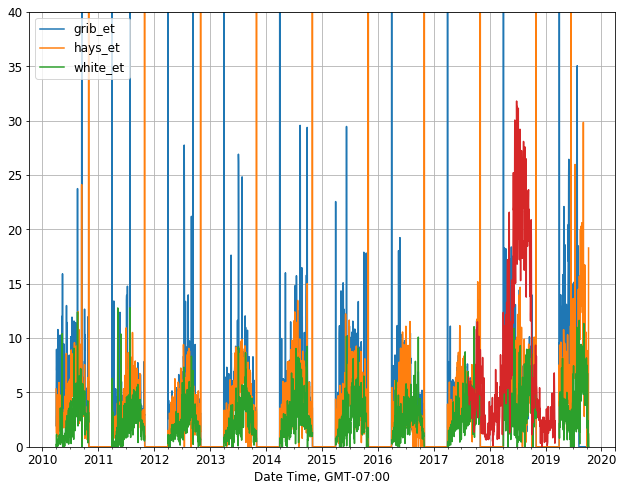

In [36]:
etdata[['grib_et','hays_et','white_et']].plot()
ugs_clim_raw_dly['et_ref'].plot()
plt.grid()
plt.ylim(0.0,40)

## Compare Penman-Monteith Ref ET to Piezometers Actual ET estimates

In [ ]:
etdata[['grib_et','hays_et','white_et']].plot()
ugs_clim_raw_dly['et_ref'].plot()
plt.grid()
plt.ylim(-5,40)
plt.xlim('2018-4-1','2018-10-1')

In [69]:
etdata.to_pickle(file_place+"calc_etdata.pickle")

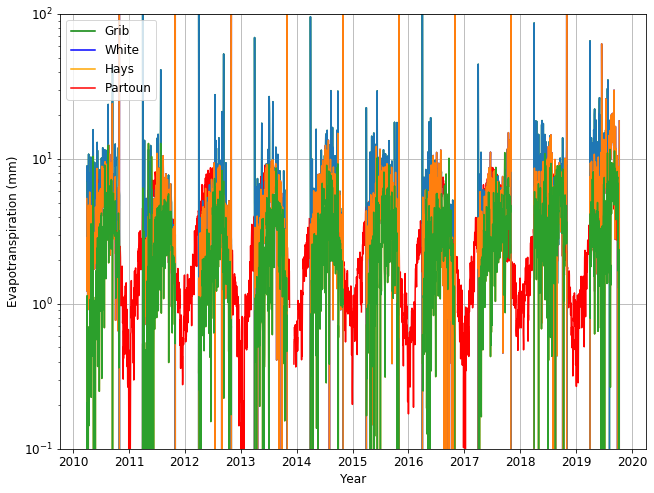

In [70]:
df = climate_data.loc[etdata.first_valid_index():etdata.last_valid_index()]
x1 = df.index
y1 = df['partoun_et']

x2 = etdata.index
y2 = etdata['grib_et']
y3 = etdata['hays_et']
y4 = etdata['white_et']

plt.plot(x2,y2, color= 'green', label = 'Grib')
plt.plot(x2,y3, color = 'blue', label='White')
plt.plot(x2,y4, color = 'orange', label= 'Hays')


plt.plot(x1,y1,label = 'Partoun',color='red')
plt.plot(x2,y2)
plt.plot(x2,y3)
plt.plot(x2,y4)
plt.ylim(0.1,100)
plt.yscale('log')
plt.grid()
plt.legend()

plt.ylabel('Evapotranspiration (mm)')
plt.xlabel('Year')

plt.savefig(figloc+"Est_ET_Values.png")
plt.savefig(figloc+"Est_ET_Values.pdf")
plt.savefig(figloc+"Est_ET_Values.svg")

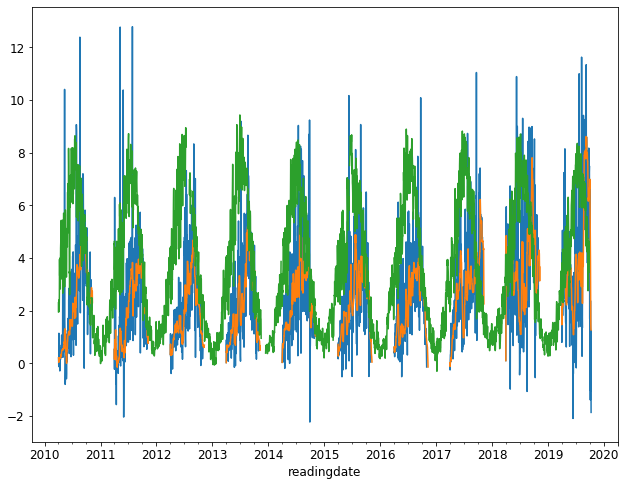

In [77]:
etdata['white_et'].plot()
etdata['white_et'].rolling('10D').median().plot()
df['partoun_et'].plot()

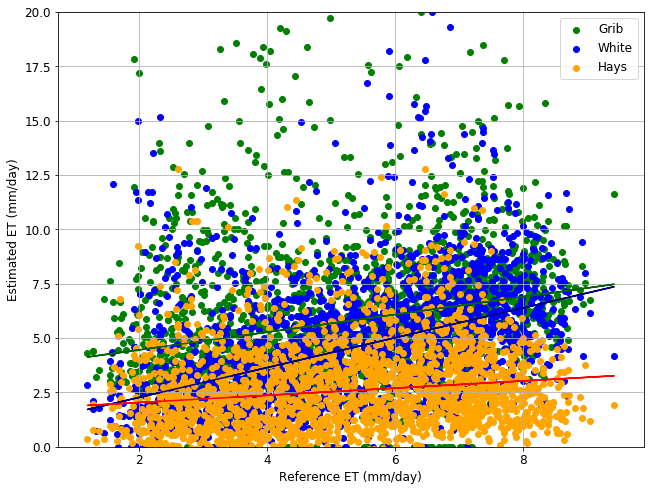

In [59]:
etdfs = pd.concat([df['partoun_et'],etdata['grib_et'],etdata['hays_et'],etdata['white_et']],axis=1)
etdfs = etdfs.dropna()

x1 = etdfs['partoun_et']
x2 = etdfs['grib_et']
x3 = etdfs['hays_et']
x4 = etdfs['white_et']

plt.scatter(x1,x2, color= 'green', label = 'Grib')
plt.scatter(x1,x3, color = 'blue', label='White')
plt.scatter(x1,x4, color = 'orange', label= 'Hays')
plt.ylim(0,20)

X1 = sm.add_constant(x1)
res2 = sm.RLM(x2,X1).fit()
res3 = sm.RLM(x3,X1).fit()
res4 = sm.RLM(x4,X1).fit()

res2p = res2.params
res3p = res3.params
res4p = res4.params

plt.plot(x1, res2p.const + res2p.partoun_et * x1, color = 'darkgreen')
plt.plot(x1, res3p.const + res3p.partoun_et * x1, color = 'navy')
plt.plot(x1, res4p.const + res4p.partoun_et * x1, color = 'red')
plt.xlabel('Reference ET (mm/day)')
plt.ylabel('Estimated ET (mm/day)')
plt.grid()
plt.legend()

plt.savefig(figloc+"et_comp_Values.png")
plt.savefig(figloc+"et_comp_Values.pdf")
plt.savefig(figloc+"et_comp_Values.svg")

In [56]:
res2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                    Robust linear Model Regression Results                    
==============================================================================
Dep. Variable:                grib_et   No. Observations:                 2070
Model:                            RLM   Df Residuals:                     2068
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Mon, 23 Dec 2019                                         
Time:                        16:18:58                                         
No. Iterations:                    22                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.6471      0.163     22.436      0.000       3.328       3.966
partoun_et     0.4057      0.029     13.857      0.000       0.348       0.463
==============================================================================

If the model instance has been used for another fit with different fit
parameters, then the fit options might not be the correct ones anymore .
"""